<h1> MIDTERM EXAM: Chicago Crime Trends: 2001-Present Data Analytics Project </h1>

<h1> ANALYST: RHEALYN VASQUEZ </h1>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import Image, display, HTML
import seaborn as sns
import folium
from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime
import warnings
warnings.filterwarnings('ignore')

In [33]:
chicago_df = pd.read_csv('datasets\\chicago_2001_present.csv')

In [3]:
display(HTML('<div style="text-align: center;"><img src="CHICAGO.jpg" width="1000"/></div>'))

# Chicago Crime Dataset

## **Dataset Overview**
The Chicago Crime dataset contains detailed crime records reported in Chicago, including crime types, locations, times, and outcomes (arrest/domestic). It is useful for exploratory data analysis (EDA), pattern discovery, and visualization.

---

## **Columns / Features**

| Column Name            | Data Type            | Description |
|------------------------|--------------------|-------------|
| ID                     | int64              | Unique identifier for each crime record |
| Case Number            | string             | Police case number |
| Date                   | datetime64[ns]     | Date and time of the crime |
| Block                  | string             | Address block where the crime occurred |
| IUCR                   | string             | Illinois Uniform Crime Reporting code |
| Primary Type           | string             | Main category of the crime (e.g., THEFT, BATTERY) |
| Description            | string             | Detailed description of the crime |
| Location Description   | string             | Specific location type (e.g., STREET, RESIDENCE) |
| Arrest                 | bool               | Whether an arrest was made |
| Domestic               | bool               | Whether the crime was domestic-related |
| Beat                   | int64              | Police beat where the crime occurred |
| District               | int64              | Police district number |
| Ward                   | int64              | City ward number |
| Community Area         | int64              | Community area number in Chicago |
| FBI Code               | string             | FBI crime code |
| X Coordinate           | float64            | Map coordinate X |
| Y Coordinate           | float64            | Map coordinate Y |
| Year                   | int64              | Year of the crime |
| Updated On             | datetime64[ns]     | Last update timestamp |
| Latitude               | float64            | Latitude coordinate |
| Longitude              | float64            | Longitude coordinate |
| Location               | string             | Latitude and Longitude combined |

---

## **Analysis Possibilities**

### **1. Univariate Analysis**
- Crime frequency by `Primary Type`
- Arrest rate (`Arrest`)
- Domestic vs non-domestic crimes (`Domestic`)
- Crime occurrence by `District`, `Ward`, or `Community Area`
- Temporal distribution: crimes by `Year` or `Date`

**Visualization ideas:**
- Bar charts, pie charts, histograms, line plots

---

### **2. Bivariate Analysis**
- `Primary Type` vs `Arrest` (arrest probability per crime type)
- `Primary Type` vs `Location Description`
- `District` vs `Primary Type`
- `Domestic` vs `Primary Type` or `Location Description`

**Visualization ideas:**
- Stacked bar charts, scatter plots, boxplots, heatmaps

---

### **3. Multivariate Analysis**
- Spatial patterns: `Latitude` & `Longitude` vs `Primary Type` vs `Arrest`
- Crime trends over time: `Date` vs `Primary Type` vs `District`
- Relationship between `Community Area`, `Primary Type`, and `Domestic`

**Visualization ideas:**
- Pair plots and grouped bar charts,

---

### **4. Data Cleaning Considerations**
- Handle missing values in `Location Description` or coordinates
- Ensure `Date` and `Updated On` are in datetime format
- Encode categorical columns for analysis (`Primary Type`, `FBI Code`, etc.)
- Remove duplicates using `ID` or `Case Number`

---

### **5. Sample Visualization Plan**

| Visualization Type       | Purpose |
|---------------------------|---------|
| Histogram of crime types  | Univariate distribution |
| Line chart of crimes over time | Temporal trends |
| Stacked bar chart: Arrest vs Crime Type | Bivariate relationship |
| Map of crime locations    | Spatial analysis |
| Pair plot of numeric columns | Multivariate correlation |

In [4]:
#this shows the 5 first row
chicago_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,13311263,JG503434,07/29/2022 03:39:00 AM,023XX S TROY ST,1582,OFFENSE INVOLVING CHILDREN,CHILD PORNOGRAPHY,RESIDENCE,True,False,...,25.0,30.0,17,NaN,NaN,2022,04/18/2024 03:40:59 PM,NaN,NaN,NaN
1,13053066,JG103252,01/03/2023 04:44:00 PM,039XX W WASHINGTON BLVD,2017,NARCOTICS,MANUFACTURE / DELIVER - CRACK,SIDEWALK,True,False,...,28.0,26.0,18,NaN,NaN,2023,01/20/2024 03:41:12 PM,NaN,NaN,NaN
2,12131221,JD327000,08/10/2020 09:45:00 AM,015XX N DAMEN AVE,0326,ROBBERY,AGGRAVATED VEHICULAR HIJACKING,STREET,True,False,...,1.0,24.0,03,1162795.0,1909900.0,2020,05/17/2025 03:40:52 PM,41.908418,-87.677407,"(41.908417822, -87.67740693)"
3,11227634,JB147599,08/26/2017 10:00:00 AM,001XX W RANDOLPH ST,0281,CRIM SEXUAL ASSAULT,NON-AGGRAVATED,HOTEL/MOTEL,False,False,...,42.0,32.0,02,NaN,NaN,2017,02/11/2018 03:57:41 PM,NaN,NaN,NaN
4,13203321,JG415333,09/06/2023 05:00:00 PM,002XX N Wells st,1320,CRIMINAL DAMAGE,TO VEHICLE,PARKING LOT / GARAGE (NON RESIDENTIAL),False,False,...,42.0,32.0,14,1174694.0,1901831.0,2023,11/04/2023 03:40:18 PM,41.886018,-87.633938,"(41.886018055, -87.633937881)"


In [5]:
#this shows quick summary of the DataFrame
chicago_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8410198 entries, 0 to 8410197
Data columns (total 22 columns):
 #   Column                Dtype  
---  ------                -----  
 0   ID                    int64  
 1   Case Number           object 
 2   Date                  object 
 3   Block                 object 
 4   IUCR                  object 
 5   Primary Type          object 
 6   Description           object 
 7   Location Description  object 
 8   Arrest                bool   
 9   Domestic              bool   
 10  Beat                  int64  
 11  District              float64
 12  Ward                  float64
 13  Community Area        float64
 14  FBI Code              object 
 15  X Coordinate          float64
 16  Y Coordinate          float64
 17  Year                  int64  
 18  Updated On            object 
 19  Latitude              float64
 20  Longitude             float64
 21  Location              object 
dtypes: bool(2), float64(7), int64(3), object(1

In [6]:
# this shows quick statistics about the data
chicago_df.describe()

,ID,Beat,District,Ward,Community Area,X Coordinate,Y Coordinate,Year,Latitude,Longitude
count,8.410198e+06,8.410198e+06,8.410151e+06,7.795376e+06,7.796511e+06,8.316513e+06,8.316513e+06,8.410198e+06,8.316513e+06,8.316513e+06
mean,7.506417e+06,1.183592e+03,1.129624e+01,2.278485e+01,3.738321e+01,1.164655e+06,1.885910e+06,2.010984e+03,4.184253e+01,-8.767129e+01
std,3.776056e+06,7.037035e+02,6.963286e+00,1.385829e+01,2.154697e+01,1.695337e+04,3.243238e+04,7.057827e+00,8.923247e-02,6.143601e-02
min,6.340000e+02,1.110000e+02,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.001000e+03,3.661945e+01,-9.168657e+01
25%,4.057425e+06,6.210000e+02,6.000000e+00,1.000000e+01,2.300000e+01,1.153071e+06,1.859206e+06,2.005000e+03,4.176894e+01,-8.771335e+01
50%,7.505136e+06,1.034000e+03,1.000000e+01,2.300000e+01,3.200000e+01,1.166207e+06,1.891022e+06,2.010000e+03,4.185656e+01,-8.766556e+01
75%,1.089433e+07,1.731000e+03,1.700000e+01,3.400000e+01,5.600000e+01,1.176401e+06,1.909404e+06,2.017000e+03,4.190708e+01,-8.762807e+01
max,1.398087e+07,2.535000e+03,3.100000e+01,5.000000e+01,7.700000e+01,1.205119e+06,1.951622e+06,2.025000e+03,4.202291e+01,-8.752453e+01


In [7]:
#marks missing values as True and others as False
chicago_df.isnull().sum()

ID                           0
Case Number                  0
Date                         0
Block                        0
IUCR                         0
Primary Type                 0
Description                  0
Location Description     14893
Arrest                       0
Domestic                     0
Beat                         0
District                    47
Ward                    614822
Community Area          613687
FBI Code                     0
X Coordinate             93685
Y Coordinate             93685
Year                         0
Updated On                   0
Latitude                 93685
Longitude                93685
Location                 93685
dtype: int64

<h1> FILLING MISSING VALUES/NULL VALUES </h1>

In [8]:
mode_loc = chicago_df['Location Description'].mode()[0]
chicago_df['Location Description'].fillna(mode_loc, inplace=True)

mode_dist = chicago_df['District'].mode()[0]
chicago_df['District'].fillna(mode_dist, inplace=True)

mode_ward = chicago_df['Ward'].mode()[0]
chicago_df['Ward'].fillna(mode_ward, inplace=True)

mode_area = chicago_df['Community Area'].mode()[0]
chicago_df['Community Area'].fillna(mode_area, inplace=True)

mean_lat = chicago_df['Latitude'].mean()
chicago_df['Latitude'].fillna(mean_lat, inplace=True)

mean_lon = chicago_df['Longitude'].mean()
chicago_df['Longitude'].fillna(mean_lon, inplace=True)

mean_x = chicago_df['X Coordinate'].mean()
chicago_df['X Coordinate'].fillna(mean_x, inplace=True)

mean_y = chicago_df['Y Coordinate'].mean()
chicago_df['Y Coordinate'].fillna(mean_y, inplace=True)

chicago_df['Location'].fillna('Unknown', inplace=True)

chicago_df.isnull().sum()

ID                      0
Case Number             0
Date                    0
Block                   0
IUCR                    0
Primary Type            0
Description             0
Location Description    0
Arrest                  0
Domestic                0
Beat                    0
District                0
Ward                    0
Community Area          0
FBI Code                0
X Coordinate            0
Y Coordinate            0
Year                    0
Updated On              0
Latitude                0
Longitude               0
Location                0
dtype: int64

<h1> CHANGING DATA TYPES OF A COLUMN </h1>

In [9]:
#changes the data type of a column or Series
chicago_df['ID'] = chicago_df['ID'].astype('int')
chicago_df['Case Number'] = chicago_df['Case Number'].astype('string')
chicago_df['Date'] = chicago_df['Date'].astype('str')
chicago_df['Date'] = chicago_df['Date'].str.replace('/', '-')
chicago_df['Date'] = pd.to_datetime(chicago_df['Date'], dayfirst=True, errors='coerce')
chicago_df['Block'] = chicago_df['Block'].astype('string')
chicago_df['IUCR'] = chicago_df['IUCR'].astype('string')
chicago_df['Primary Type'] = chicago_df['Primary Type'].astype('string')
chicago_df['Description'] = chicago_df['Description'].astype('string')
chicago_df['Location Description'] = chicago_df['Location Description'].astype('string')
chicago_df['Arrest'] = chicago_df['Arrest'].astype('bool')
chicago_df['Domestic'] = chicago_df['Domestic'].astype('bool')
chicago_df['Beat'] = chicago_df['Beat'].astype('int')
chicago_df['District'] = chicago_df['District'].astype('int')
chicago_df['Ward'] = chicago_df['Ward'].astype('int')
chicago_df['Community Area'] = chicago_df['Community Area'].astype('int')
chicago_df['FBI Code'] = chicago_df['FBI Code'].astype('string')
chicago_df['X Coordinate'] = chicago_df['X Coordinate'].astype('float')
chicago_df['Y Coordinate'] = chicago_df['Y Coordinate'].astype('float')
chicago_df['Year'] = chicago_df['Year'].astype('int')
chicago_df['Updated On'] = pd.to_datetime(chicago_df['Updated On'], dayfirst=True, errors='coerce')
chicago_df['Latitude'] = chicago_df['Latitude'].astype('float')
chicago_df['Longitude'] = chicago_df['Longitude'].astype('float')
chicago_df['Location'] = chicago_df['Location'].astype('string')

In [10]:
chicago_df.dtypes

ID                               int64
Case Number             string[python]
Date                    datetime64[ns]
Block                   string[python]
IUCR                    string[python]
Primary Type            string[python]
Description             string[python]
Location Description    string[python]
Arrest                            bool
Domestic                          bool
Beat                             int64
District                         int64
Ward                             int64
Community Area                   int64
FBI Code                string[python]
X Coordinate                   float64
Y Coordinate                   float64
Year                             int64
Updated On              datetime64[ns]
Latitude                       float64
Longitude                      float64
Location                string[python]
dtype: object

<h1> EXTRACTING DATE INFORMATION USING PANDAS DATE TIME </h1>

In [11]:
# extract parts of the date
chicago_df['Year'] = chicago_df['Date'].dt.year
chicago_df['Month'] = chicago_df['Date'].dt.month
chicago_df['Month_Name'] = chicago_df['Date'].dt.month_name()
chicago_df['Day'] = chicago_df['Date'].dt.day
chicago_df['Week'] = chicago_df['Date'].dt.isocalendar().week
chicago_df['Day_Name'] = chicago_df['Date'].dt.day_name()
chicago_df['Hour'] = chicago_df['Date'].dt.hour

hour_labels = {
    0: "12 AM", 1: "1 AM", 2: "2 AM", 3: "3 AM", 4: "4 AM", 5: "5 AM",
    6: "6 AM", 7: "7 AM", 8: "8 AM", 9: "9 AM", 10: "10 AM", 11: "11 AM",
    12: "12 PM", 13: "1 PM", 14: "2 PM", 15: "3 PM", 16: "4 PM", 17: "5 PM",
    18: "6 PM", 19: "7 PM", 20: "8 PM", 21: "9 PM", 22: "10 PM", 23: "11 PM"
}
chicago_df['Hour_Label'] = chicago_df['Hour'].map(hour_labels)

chicago_df[['Date', 'Year', 'Month', 'Month_Name', 'Day', 'Week', 'Day_Name', 'Hour', 'Hour_Label']].head()

,Date,Year,Month,Month_Name,Day,Week,Day_Name,Hour,Hour_Label
0,2022-07-29 03:39:00,2022,7,July,29,30,Friday,3,3 AM
1,2023-01-03 16:44:00,2023,1,January,3,1,Tuesday,16,4 PM
2,2020-08-10 09:45:00,2020,8,August,10,33,Monday,9,9 AM
3,2017-08-26 10:00:00,2017,8,August,26,34,Saturday,10,10 AM
4,2023-09-06 17:00:00,2023,9,September,6,36,Wednesday,17,5 PM


<h1 style="color:#0d8dfc;"> DATA ANALYSIS</h1>
<hr>

<h1> UNIVARIATE </h1>

<h1> 1. At what time of day do most crimes occur (morning, afternoon, evening, night)? </h1>

In [12]:
def time_of_day(hour):
    if 5 <= hour < 12:
        return "Morning"
    elif 12 <= hour < 17:
        return "Afternoon"
    elif 17 <= hour < 21:
        return "Evening"
    else:
        return "Night"

chicago_df['Time_of_Day'] = chicago_df['Hour'].apply(time_of_day)

time_table = (chicago_df['Time_of_Day']
              .value_counts(normalize=True)
              .mul(100)
              .round(1)
              .astype(str) + '%')

time_table.to_frame(name='Percentage')

,Percentage
Time_of_Day,
Night,30.7%
Afternoon,25.9%
Evening,21.8%
Morning,21.7%


<h1>INSIGHT 1:</h1>
<p> Most crimes happen at night (30.7%), which is higher than at any other time of day. This suggests that darkness and fewer people on the streets make it easier for crimes to take place without being noticed. It highlights the need for stronger safety measures at night, such as better street lighting, increased police patrols, and public awareness to encourage safer behavior during late hours. </p>

<h1>INSIGHT 2:</h1>
<p> Morning (21.7%) has the lowest crime rate, while afternoon (25.9%) and evening (21.8%) are slightly higher. This shows that mornings are relatively safer, likely because people are on their way to work or school and the streets are busier. However, as the day goes on, crime rises when more people are returning home, traveling, or gathering in public spaces. These patterns suggest that safety efforts in the afternoon and evening should focus on busy places like bus stops, train stations, and shopping areas to reduce risks. </p>

<h1> 2. Which type of crime is the most common in Chicago, and what does this reveal about the city’s main safety challenges?</h1>

In [13]:
top_crimes = (chicago_df['Primary Type']
              .value_counts()
              .head(10)
              .to_frame(name='Count'))

top_crimes['Percentage'] = (top_crimes['Count'] / chicago_df.shape[0] * 100).round(1).astype(str) + '%'

top_crimes

,Count,Percentage
Primary Type,,
THEFT,1785150,21.2%
BATTERY,1532491,18.2%
CRIMINAL DAMAGE,956346,11.4%
NARCOTICS,763342,9.1%
ASSAULT,563123,6.7%
OTHER OFFENSE,524325,6.2%
BURGLARY,444757,5.3%
MOTOR VEHICLE THEFT,429681,5.1%
DECEPTIVE PRACTICE,387055,4.6%


<h1>INSIGHT 3:</h1>
<p> The top three crimes — Theft (21.2%), Battery (18.2%), and Criminal Damage (11.4%) — together account for more than half of all reported crimes in Chicago. This highlights that both property crimes and violent offenses are the city’s main safety challenges, meaning prevention efforts should focus most on these categories. </p>

<h1> 3. How often do crimes involve an arrest, and what does this show about police action?</h1>

In [14]:
arrest_counts = (chicago_df['Arrest']
                 .value_counts(normalize=True)
                 .mul(100)
                 .round(1)
                 .astype(str) + '%')

arrest_counts.to_frame(name='Percentage')

,Percentage
Arrest,
False,74.8%
True,25.2%


<h1>INSIGHT 4:</h1>
<p> The data shows that only 25.2% of reported crimes in Chicago result in an arrest, while 74.8% do not. This suggests that the majority of crimes remain unresolved, pointing to challenges such as lack of evidence, limited resources, or difficulties in identifying suspects. </p>

<h1>INSIGHT 5:</h1>
<p> Since most crimes do not result in an arrest, this could mean offenders feel less risk of being caught. This highlights the importance of targeted policing during high-crime times and places, so that law enforcement can increase visibility and deter repeat offenses. </p>

<h1> 4. Which district records the highest number of crimes, and what does this tell us about crime concentration in Chicago? </h1>

In [15]:
district_crimes = (chicago_df['District']
                   .value_counts()
                   .head(10)
                   .to_frame(name='Count'))

district_crimes['Percentage'] = (district_crimes['Count'] / chicago_df.shape[0] * 100).round(1).astype(str) + '%'
district_crimes.index.name = "District"
district_crimes['Count'] = district_crimes['Count'].map('{:,}'.format)
district_crimes

,Count,Percentage
District,,
8,"564,238",6.7%
11,"533,900",6.3%
6,"491,396",5.8%
7,"476,344",5.7%
4,"476,306",5.7%
25,"475,067",5.6%
3,"426,761",5.1%
12,"424,199",5.0%
9,"408,052",4.9%


<h1>INSIGHT 6:</h1>
<p> The data shows that certain districts report far more crimes than others, meaning crime is not spread evenly across Chicago. This concentration highlights areas where law enforcement and community safety programs should be prioritized to have the greatest impact. </p>

<h1>5. Which locations in Chicago report the highest number of crimes, and what does this reveal about where crimes are most likely to occur? </h1>

In [16]:
location_crimes = (chicago_df['Location Description']
                   .value_counts(normalize=True)
                   .mul(100)
                   .round(1)
                   .to_frame(name='Percentage')).round(1).astype(str) + '%'

location_crimes['Count'] = chicago_df['Location Description'].value_counts()
location_crimes = location_crimes[['Count', 'Percentage']]
location_crimes.head(10)

,Count,Percentage
Location Description,,
STREET,2212180,26.3%
RESIDENCE,1381812,16.4%
APARTMENT,998492,11.9%
SIDEWALK,761765,9.1%
OTHER,269939,3.2%
PARKING LOT/GARAGE(NON.RESID.),202930,2.4%
ALLEY,187348,2.2%
SMALL RETAIL STORE,168926,2.0%
"SCHOOL, PUBLIC, BUILDING",146368,1.7%


<h1>INSIGHT 7:</h1>
<p> The table shows that most crimes in Chicago happen on streets and  in residences. This highlights that both public spaces and residential areas are vulnerable, emphasizing the need for targeted safety measures such as improved lighting, community policing, and surveillance to reduce crime in these high-risk areas. </p>

<h1>INSIGHT 8:</h1>
<p> The data shows that a significant portion of crimes also occur in apartments and sidewalks, suggesting that multi-unit residential buildings and pedestrian areas are at notable risk. Implementing measures such as secure building access, surveillance cameras, and increased monitoring of public walkways can help enhance safety in these frequently targeted locations.</p>

<h1> 6. On which days of the week does crime occur most frequently in Chicago, and what does this reveal about patterns in criminal activity throughout the week?</h1>

In [17]:
# count crimes by day of the week
day_counts = (chicago_df['Day_Name']
              .value_counts(normalize=True)
              .mul(100)
              .round(1)
              .to_frame(name='Percentage')).round(1).astype(str) + '%'

day_counts['Count'] = chicago_df['Day_Name'].value_counts()
day_counts = day_counts[['Count', 'Percentage']]
day_counts

,Count,Percentage
Day_Name,,
Friday,1261341,15.0%
Wednesday,1208169,14.4%
Saturday,1206357,14.3%
Tuesday,1200628,14.3%
Thursday,1196290,14.2%
Monday,1189517,14.1%
Sunday,1147896,13.6%


<h1>INSIGHT 9:</h1>
<p> The data shows that crimes in Chicago occur most frequently on Fridays (15.0%), followed by Wednesday (14.4%) and Saturday (14.3%). This reveals that criminal activity tends to peak toward the end of the workweek and midweek, suggesting that law enforcement and community safety programs could focus on these higher-risk days to better prevent and respond to crimes. </p>

<h1>INSIGHT 10:</h1>
<p> The analysis shows that Sundays (13.6%) and Mondays (14.1%) have the lowest crime rates in Chicago. This indicates that early weekdays and weekends start are relatively safer periods. Law enforcement could use this information to optimize patrol schedules, focusing fewer resources on these lower-risk days while concentrating preventive measures on higher-risk days like Fridays and Wednesdays, making overall crime management more efficient. </p>


<h1>7. Which months experience the highest and lowest number of reported crimes in Chicago, and what does this reveal about seasonal crime patterns throughout the year?</h1>

In [18]:
# count crimes by month name
month_name_counts = (chicago_df['Month_Name']
                     .value_counts(normalize=True)
                     .reindex([
                         'January', 'February', 'March', 'April', 'May', 'June',
                         'July', 'August', 'September', 'October', 'November', 'December'
                     ])
                     .mul(100)
                     .round(1)
                     .to_frame(name='Percentage'))

month_name_counts['Count'] = chicago_df['Month_Name'].value_counts().reindex([
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
])
month_name_counts = month_name_counts[['Count', 'Percentage']]
month_name_counts

,Count,Percentage
Month_Name,,
January,661245,7.9
February,584438,6.9
March,691342,8.2
April,688252,8.2
May,748780,8.9
June,748862,8.9
July,787986,9.4
August,778827,9.3
September,727097,8.6


<h1>INSIGHT 11:</h1>
<p> The analysis shows that crime in Chicago peaks in <strong>July</strong> (9.4%), followed closely by August (9.3%) and June (8.9%), while the winter months, particularly December (7.4%) and February (6.9%), have the lowest crime rates. This indicates that warmer months with more outdoor activity and social interactions may contribute to higher crime levels. Law enforcement can use this information to increase patrols, community awareness programs, and preventive measures during the summer to enhance public safety. </p>

<h1> BIVARIATE </h1>

<h1>8. How often do BATTERY incidents result in an arrest, and what does this reveal about law enforcement effectiveness? </h1>

In [19]:
battery_arrest = chicago_df[chicago_df['Primary Type'] == 'BATTERY'].groupby('Arrest').size()
battery_arrest_percentage = (battery_arrest / battery_arrest.sum() * 100).round(2).astype(str) + '%'
battery_arrest_df = battery_arrest_percentage.to_frame(name='Percentage')
battery_arrest_df

,Percentage
Arrest,
False,78.34%
True,21.66%


<h1>INSIGHT 12:</h1>
<p> The data shows that a moderate portion of BATTERY incidents lead to arrests.
This suggests that police may need to strengthen follow-up investigations for BATTERY cases, and civilians should remain aware that not all incidents are resolved quickly. </p>

<h1> 9. Is the likelihood of an arrest influenced by the type of crime committed?</h1>

In [20]:
arrest_summary = chicago_df.groupby('Primary Type')['Arrest'].agg(['count', 'sum'])
arrest_summary['Arrest Rate (%)'] = round((arrest_summary['sum'] / arrest_summary['count']) * 100, 2).astype(str) + '%'
arrest_summary = arrest_summary.sort_values(by='Arrest Rate (%)', ascending=False).head(10)
arrest_summary

,count,sum,Arrest Rate (%)
Primary Type,,,
PROSTITUTION,70405,70094,99.56%
NARCOTICS,763342,758356,99.35%
GAMBLING,14663,14556,99.27%
LIQUOR LAW VIOLATION,15377,15225,99.01%
PUBLIC INDECENCY,215,211,98.14%
CONCEALED CARRY LICENSE VIOLATION,1633,1577,96.57%
INTERFERENCE WITH PUBLIC OFFICER,20176,18488,91.63%
HUMAN TRAFFICKING,137,13,9.49%
ROBBERY,314286,29084,9.25%


# INSIGHT 13:
The data shows that PROSTITUTION incidents have an extremely high arrest rate (99.56%). This indicates that these offenses are closely monitored and swiftly addressed by law enforcement.

# INSIGHT 14:
These findings suggest that PROSTITUTION cases require careful handling, as their high arrest rates reflect both the prevalence of the offense and the legal and social complexities involved in apprehending offenders.

# INSIGHT 15:
It is notable that despite the high arrest rates, some PROSTITUTION incidents may still not lead to immediate resolution. This implies a need for follow-up investigations and preventive strategies to reduce repeat offenses and protect vulnerable individuals involved.

# 10. Which locations in Chicago account for the highest number of HOMICIDE incidents?

In [21]:
homicide_df = chicago_df[chicago_df['Primary Type'] == 'HOMICIDE']

homicide_location = homicide_df['Location Description'].value_counts().head(10)

homicide_location_percent = round((homicide_location / homicide_location.sum()) * 100, 2).astype(str) + '%'

homicide_location_df = pd.DataFrame({
    'Homicide Count': homicide_location,
    'Percentage (%)': homicide_location_percent
})

homicide_location_df

,Homicide Count,Percentage (%)
Location Description,,
STREET,7027,55.92%
AUTO,1389,11.05%
APARTMENT,1218,9.69%
ALLEY,894,7.11%
HOUSE,709,5.64%
PORCH,407,3.24%
YARD,331,2.63%
PARKING LOT,286,2.28%
PARK PROPERTY,161,1.28%


# INSIGHT 16:
Analysis of the data shows that STREETS account for the majority of HOMICIDE incidents (55.92%), making them the most common locations for violent crime in Chicago. This indicates that public and easily accessible areas are particularly vulnerable to violent offenses, and incidents on streets may involve a wider range of perpetrators and circumstances compared to private locations.

# INSIGHT 17:
The data shows that homicides occurring on STREETS far exceed those in other locations such as AUTOS, APARTMENTS, or ALLEYS. This underscores the high-risk nature of open public areas where monitoring is more challenging, and interactions between individuals may escalate quickly, resulting in violent outcomes.

# INSIGHT 18:
These findings suggest that law enforcement should prioritize comprehensive strategies for street safety, including increasing the presence of patrols, deploying rapid response units to high-risk areas, installing better lighting and surveillance systems, and engaging with the community to prevent conflicts before they escalate. Targeted interventions on streets could significantly reduce homicide rates and improve overall public safety.

# 11. What weapons or methods are most commonly used in robbery incidents in Chicago?

In [22]:
robbery_df = chicago_df[chicago_df['Primary Type'] == 'ROBBERY']

robbery_counts = robbery_df['Description'].value_counts().head(10)

robbery_percent = round((robbery_counts / robbery_counts.sum()) * 100, 2).astype(str) + '%'

robbery_table = pd.DataFrame({
    'Count': robbery_counts,
    'Percentage': robbery_percent
})

robbery_table

,Count,Percentage
Description,,
ARMED: HANDGUN,93191,31.96%
STRONGARM - NO WEAPON,91472,31.37%
ARMED - HANDGUN,19928,6.83%
AGGRAVATED,15787,5.41%
AGGRAVATED VEHICULAR HIJACKING,15343,5.26%
ARMED: OTHER DANGEROUS WEAPON,12932,4.44%
ARMED:KNIFE/CUTTING INSTRUMENT,12224,4.19%
STRONG ARM - NO WEAPON,12012,4.12%
ATTEMPT: STRONGARM-NO WEAPON,10201,3.5%


# INSIGHT 19:
The data shows that nearly two-thirds of robberies involve either firearms (ARMED: HANDGUN – 31.96%) or physical force without a weapon (STRONGARM – 31.37%). This indicates that while guns remain a dominant threat in robberies, a significant share of incidents also rely solely on physical intimidation, highlighting the dual challenge of reducing firearm access and addressing violence through community safety initiatives.

# 12. During which hours of the day are SEX OFFENSE incidents most likely to occur, and what does this reveal about patterns of vulnerability in Chicago?

In [23]:
offense_df = chicago_df[chicago_df['Primary Type'] == 'SEX OFFENSE']
offense_df['Hour'] = offense_df['Date'].dt.hour

offense_hour = offense_df['Hour'].value_counts().sort_index()

# Convert 24h to 12h format with AM/PM
hour_labels = {h: pd.to_datetime(str(h), format='%H').strftime('%I %p') for h in range(24)}
offense_hour.index = offense_hour.index.map(hour_labels)

offense_hour_table = pd.DataFrame({
    'Count': offense_hour,
    'Percentage': round((offense_hour / offense_hour.sum()) * 100, 2).astype(str) + '%'
})

offense_hour_table

,Count,Percentage
Hour,,
12 AM,4180,12.25%
01 AM,928,2.72%
02 AM,801,2.35%
03 AM,782,2.29%
04 AM,595,1.74%
05 AM,516,1.51%
06 AM,585,1.71%
07 AM,1102,3.23%
08 AM,1664,4.88%


# INSIGHT 20:
The data reveals that SEX OFFENSE incidents are most concentrated around midnight (12 AM), which alone accounts for over 12% of all cases — significantly higher than any other hour of the day. While offenses are distributed throughout the day, this midnight peak suggests heightened vulnerability during late-night hours when public visibility and social oversight are lowest. These findings highlight the need for targeted preventive strategies such as improved nighttime safety infrastructure, increased patrol presence after dark, and community-based awareness efforts focused on reducing risks during late evening and early morning hours.  

**Suggestion:** Authorities should prioritize safety programs tailored for nighttime activity, such as deploying mobile patrol units in hotspots, collaborating with local businesses and transport providers to create safe passage routes, and encouraging public participation in neighborhood watch programs to strengthen community safety after dark.

# MULTIVARIATE

# 13. Do theft incidents involving amounts OVER $500 tend to occur more frequently in certain regions of Chicago, and what might this reveal about patterns of targeted crime across the city

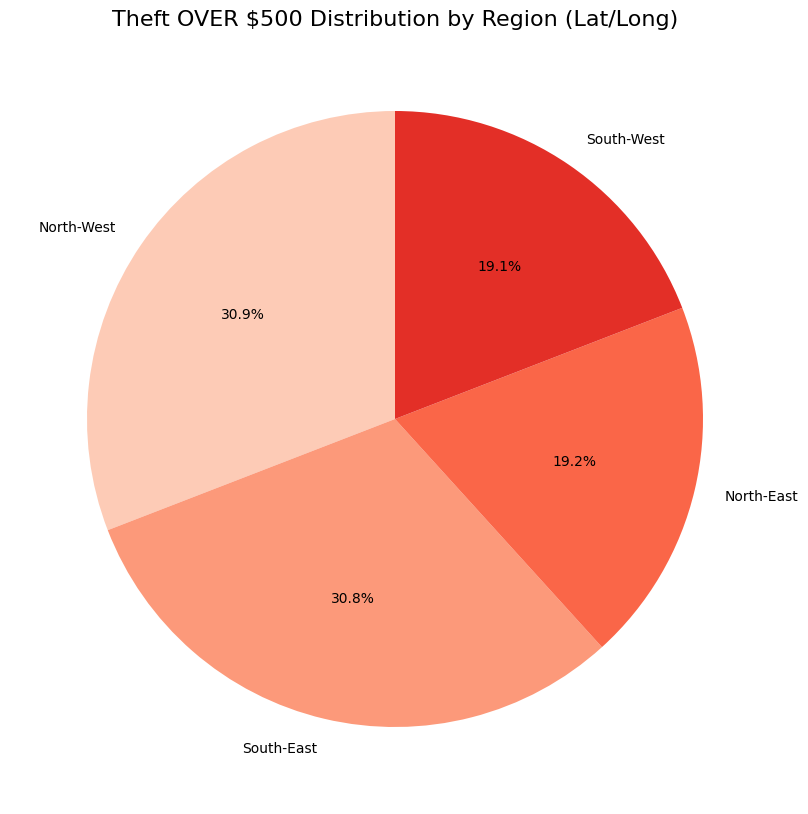

In [24]:
theft_df = chicago_df[
    (chicago_df['Primary Type'] == 'THEFT') & 
    (chicago_df['Description'] == 'OVER $500')
].dropna(subset=['Latitude','Longitude'])

conditions = [
    (theft_df['Latitude'] >= theft_df['Latitude'].median()) & (theft_df['Longitude'] <= theft_df['Longitude'].median()),
    (theft_df['Latitude'] >= theft_df['Latitude'].median()) & (theft_df['Longitude'] > theft_df['Longitude'].median()),
    (theft_df['Latitude'] < theft_df['Latitude'].median()) & (theft_df['Longitude'] <= theft_df['Longitude'].median()),
    (theft_df['Latitude'] < theft_df['Latitude'].median()) & (theft_df['Longitude'] > theft_df['Longitude'].median())
]

region_names = ['North-West', 'North-East', 'South-West', 'South-East']
theft_df['Region'] = np.select(conditions, region_names, default='Unknown')

region_counts = theft_df['Region'].value_counts()

plt.figure(figsize=(12,10))  
plt.pie(
    region_counts,
    labels=region_counts.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Reds(range(50, 250, 40))
)
plt.title("Theft OVER $500 Distribution by Region (Lat/Long)", fontsize=16)
plt.show()


# INSIGHT 21:
The analysis reveals that theft incidents involving amounts OVER $500 are not evenly distributed across Chicago. Certain regions show noticeably higher concentrations, suggesting that offenders may be targeting areas where higher-value opportunities are more accessible, such as commercial districts or wealthier residential zones.

# INSIGHT 22: 
This pattern indicates that thefts of greater monetary value are likely influenced by both economic activity and the perceived presence of valuable property in specific neighborhoods.

**Suggestion:** Law enforcement could increase surveillance and preventive patrols in high-incidence regions, while community awareness programs can educate residents and businesses on preventive measures such as improved lighting, secure storage, and neighborhood watch initiatives.  

# 14. How do the top 5 crime types vary across different regions of Chicago when analyzed using X and Y geographic coordinates?

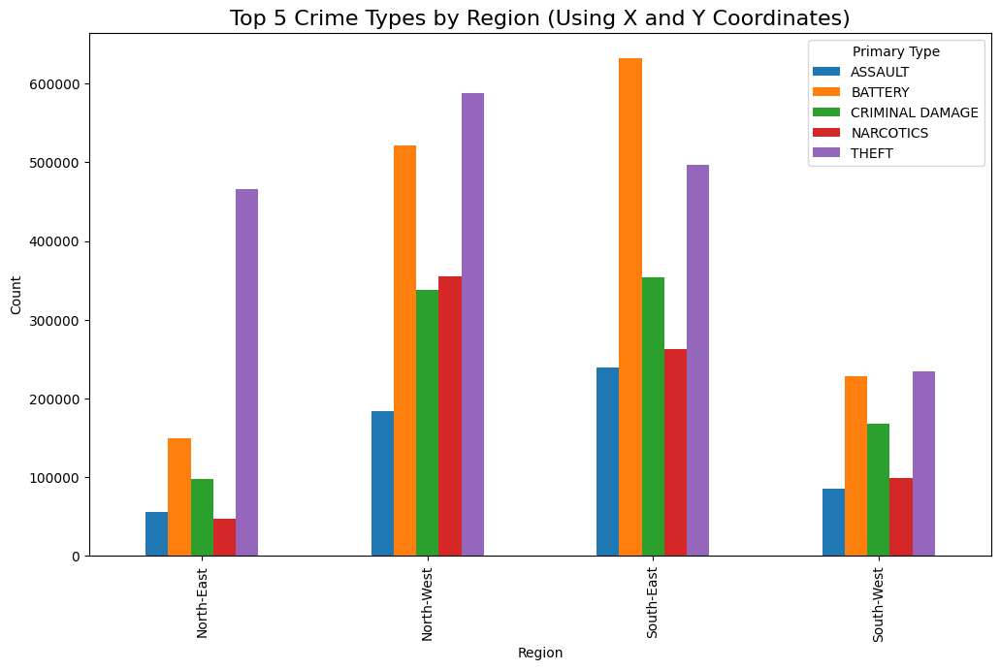

In [25]:
top_types = chicago_df['Primary Type'].value_counts().head(5).index
subset_df = chicago_df[chicago_df['Primary Type'].isin(top_types)].dropna(subset=['X Coordinate','Y Coordinate'])

x_median = subset_df['X Coordinate'].median()
y_median = subset_df['Y Coordinate'].median()

conditions = [
    (subset_df['X Coordinate'] >= x_median) & (subset_df['Y Coordinate'] >= y_median),
    (subset_df['X Coordinate'] < x_median) & (subset_df['Y Coordinate'] >= y_median),
    (subset_df['X Coordinate'] >= x_median) & (subset_df['Y Coordinate'] < y_median),
    (subset_df['X Coordinate'] < x_median) & (subset_df['Y Coordinate'] < y_median)
]

region_names = ['North-East', 'North-West', 'South-East', 'South-West']
subset_df['Region'] = np.select(conditions, region_names, default='Unknown')

region_crime_counts = subset_df.groupby(['Region','Primary Type']).size().unstack().fillna(0)

region_crime_counts.plot(kind='bar', figsize=(12,7))
plt.title("Top 5 Crime Types by Region (Using X and Y Coordinates)", fontsize=16)
plt.xlabel("Region")
plt.ylabel("Count")
plt.legend(title="Primary Type")
plt.show()

# INSIGHT 23:
The South-East region records the highest number of BATTERY and CRIMINAL DAMAGE cases compared to other regions. This indicates that violent crimes and property-related offenses are concentrated in this part of Chicago, pointing to possible social stressors or higher population density in these areas.

# INSIGHT 24:
THEFT is consistently the most common crime across all regions, with particularly high counts in the North-West and South-East. This demonstrates that theft is not isolated but a systemic urban issue, often linked to economic activity and dense public spaces.

**Suggestion:** Community-based violence prevention programs, increased police visibility, and neighborhood partnerships could help reduce confrontation-driven offenses in the South-East and North-West.

# 15. What patterns can be observed in the occurrence of crimes across the six most common locations in Chicago from 2019 to 2025, and how have these locations experienced changes in crime frequency over the years?

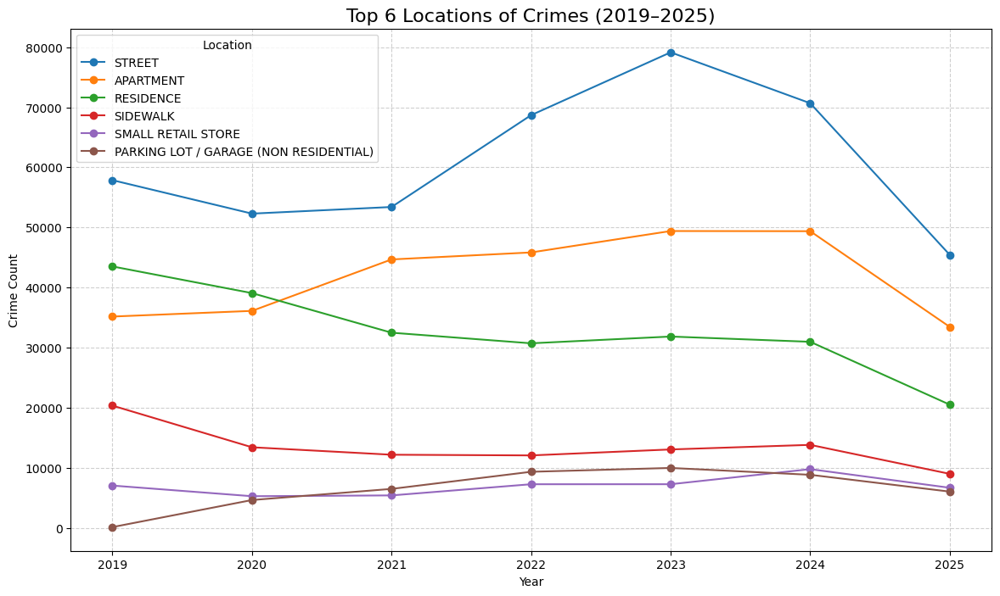

In [26]:
crime_years = chicago_df[chicago_df['Year'].between(2019, 2025)]

top_locations = crime_years['Location Description'].value_counts().head(6).index
location_df = crime_years[crime_years['Location Description'].isin(top_locations)]

pivot_table = (
    location_df
    .groupby(['Year', 'Location Description'])
    .size()
    .reset_index(name='Count')
)

plt.figure(figsize=(14,8))

for loc in top_locations:
    loc_data = pivot_table[pivot_table['Location Description'] == loc]
    plt.plot(loc_data['Year'], loc_data['Count'], marker='o', label=loc)

plt.title("Top 6 Locations of Crimes (2019–2025)", fontsize=16)
plt.xlabel("Year")
plt.ylabel("Crime Count")
plt.legend(title="Location")
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()

# INSIGHT 25:
Street crimes dominate – The street consistently records the highest number of crimes across all years, peaking in 2023 before slightly declining, showing that public, open areas remain the most vulnerable crime spots.

**Recommendation:**
City authorities should strengthen street-level surveillance and patrols, especially during peak years, while also enhancing apartment complex security measures

# 16. How does the likelihood of arrests for battery crimes vary across months in Chicago, and are there seasonal trends in battery incidents?

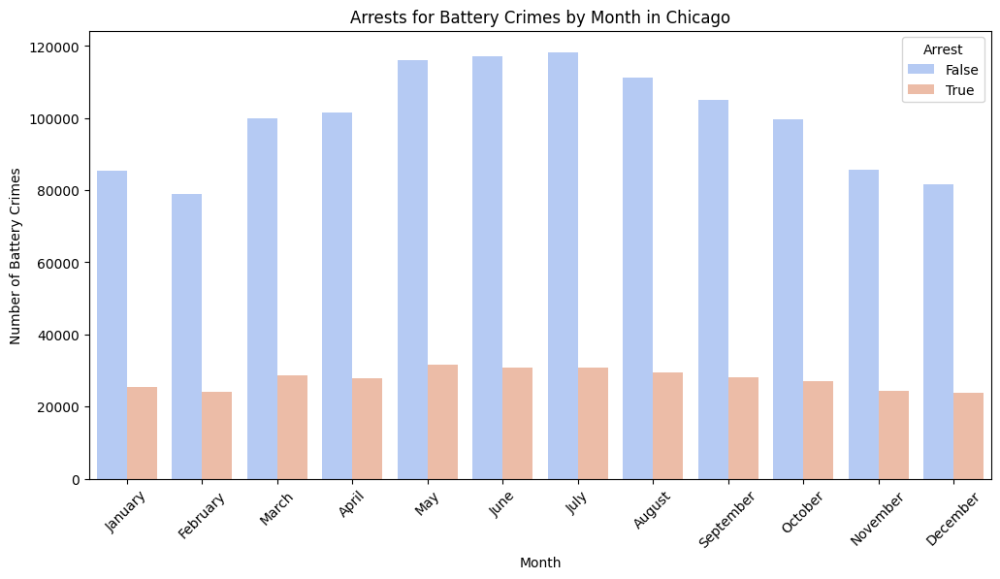

In [27]:
chicago_df['Battery'] = (chicago_df['Primary Type'] == 'BATTERY').astype(int)
battery_df = chicago_df[chicago_df['Battery'] == 1].copy()

plt.figure(figsize=(12,6))
sns.countplot(data=battery_df, x='Month_Name', hue='Arrest', palette='coolwarm',
              order=['January','February','March','April','May','June',
                     'July','August','September','October','November','December'])
plt.title('Arrests for Battery Crimes by Month in Chicago')
plt.xlabel('Month')
plt.ylabel('Number of Battery Crimes')
plt.legend(title='Arrest')
plt.xticks(rotation=45)
plt.show()

### Insight and Recommendation: Seasonal Spike in Battery Incidents Suggests Need for Proactive Summer Strategy

# Insight 26:
The data reveals a distinct **seasonal pattern** in battery crimes, with a significant surge during the summer months, peaking from **May to July**. While the number of arrests follows this trend, the number of incidents **not resulting in an arrest** is substantially higher across all months and drives this summer spike. This suggests that factors like warmer weather, increased public gatherings, and more time spent outdoors likely contribute to a higher volume of altercations. 

**Recommendation:** Law enforcement and community safety programs should implement a **targeted, proactive summer initiative**. This could involve:
* **Increased Patrols:** Deploying additional resources and increasing police presence in public areas like parks, beaches, and entertainment districts during peak summer months. 
* **Community Engagement:** Launching public awareness campaigns focused on conflict de-escalation before the summer season begins. 
* **Further Analysis:** Investigating the specific locations and contexts of these summer battery incidents to identify hotspots and tailor more precise intervention strategies. 

# 17. How do the selected crime types vary in frequency across the days of the week in Chicago? Are there any noticeable patterns in which crimes are more common on specific days?

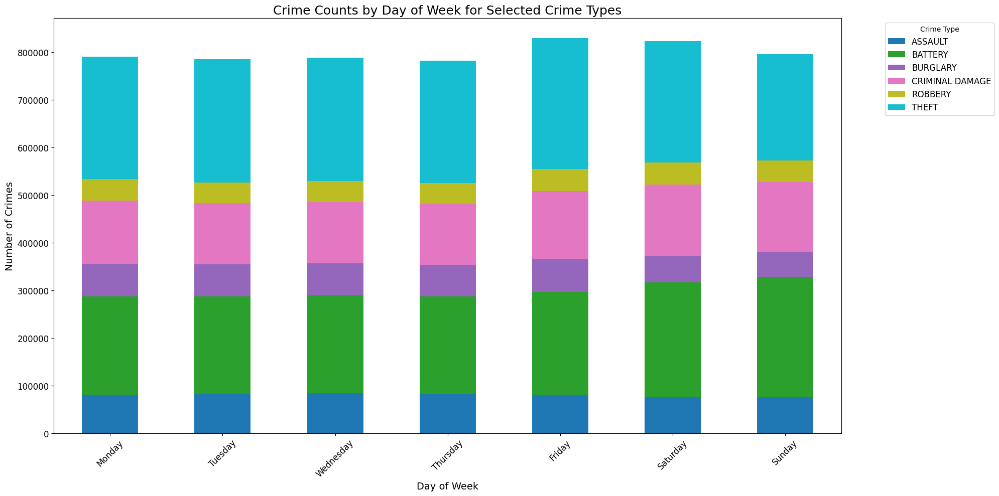

In [28]:
chicago_df = chicago_df[['Primary Type', 'Date']]
chicago_df['Date'] = pd.to_datetime(chicago_df['Date'])
chicago_df['Day_Name'] = chicago_df['Date'].dt.day_name()

selected_crimes = ['THEFT', 'BATTERY', 'CRIMINAL DAMAGE', 'ASSAULT', 'BURGLARY', 'ROBBERY']
subset_df = chicago_df[chicago_df['Primary Type'].isin(selected_crimes)]

# Aggregate counts by day and crime type
counts = subset_df.groupby(['Day_Name', 'Primary Type']).size().unstack(fill_value=0)
counts = counts.reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Plot stacked bar
counts.plot(kind='bar', stacked=True, figsize=(20, 10), colormap='tab10')

plt.title('Crime Counts by Day of Week for Selected Crime Types', fontsize=18)
plt.xlabel('Day of Week', fontsize=14)
plt.ylabel('Number of Crimes', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Crime Type', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
plt.tight_layout()
plt.show()

## INAIGHT 27: 
There is a clear rise in total crime on Fridays and Saturdays. This rise is mostly caused by Theft (the biggest crime type) and Battery (the second biggest). This trend shows that as people go out more on the weekend, crimes like theft and fights also go up.

## INSIGHT 28:
Unlike most other crimes, Burglary usually happens more often on the weekdays, with fewer cases on Saturday and Sunday. This opposite pattern shows that thieves probably target homes when people are away at work or school, making empty weekday houses easier targets than full weekend ones.

# 18. How do the daily and weekly patterns of violent, property, and statutory crimes differ from each other?

In [29]:
chicago_df['Day of Week'] = chicago_df['Date'].dt.day_name()

def get_time_of_day(hour):
    if 5 <= hour < 12: return 'Morning (5am-12pm)'
    elif 12 <= hour < 17: return 'Afternoon (12pm-5pm)'
    elif 17 <= hour < 21: return 'Evening (5pm-9pm)'
    else: return 'Night (9pm-5am)'
chicago_df['Time of Day'] = chicago_df['Date'].dt.hour.apply(get_time_of_day)

def get_crime_category(crime):
    if crime in ['BATTERY', 'ASSAULT', 'ROBBERY', 'HOMICIDE']: return 'Violent'
    elif crime in ['THEFT', 'BURGLARY', 'MOTOR VEHICLE THEFT', 'CRIMINAL DAMAGE']: return 'Property'
    elif crime in ['NARCOTICS', 'WEAPONS VIOLATION', 'PUBLIC PEACE VIOLATION']: return 'Statutory/Other'
    else: return None
chicago_df['Crime Category'] = chicago_df['Primary Type'].apply(get_crime_category)

df_filtered = chicago_df.dropna(subset=['Crime Category']).copy()

crime_counts = df_filtered.groupby(['Day of Week', 'Time of Day', 'Crime Category']).size().reset_index(name='Count')

day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
crime_counts['Day of Week'] = pd.Categorical(crime_counts['Day of Week'], categories=day_order, ordered=True)

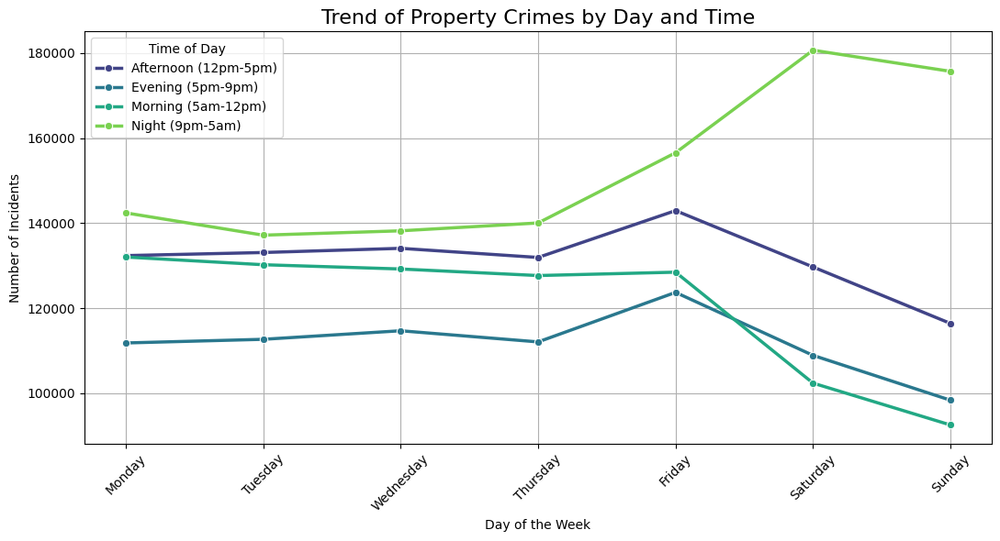

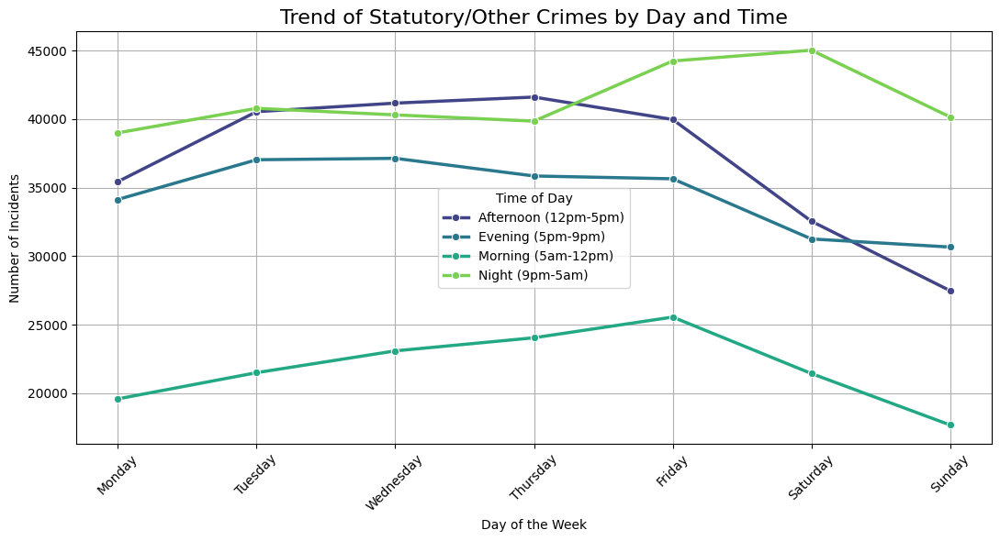

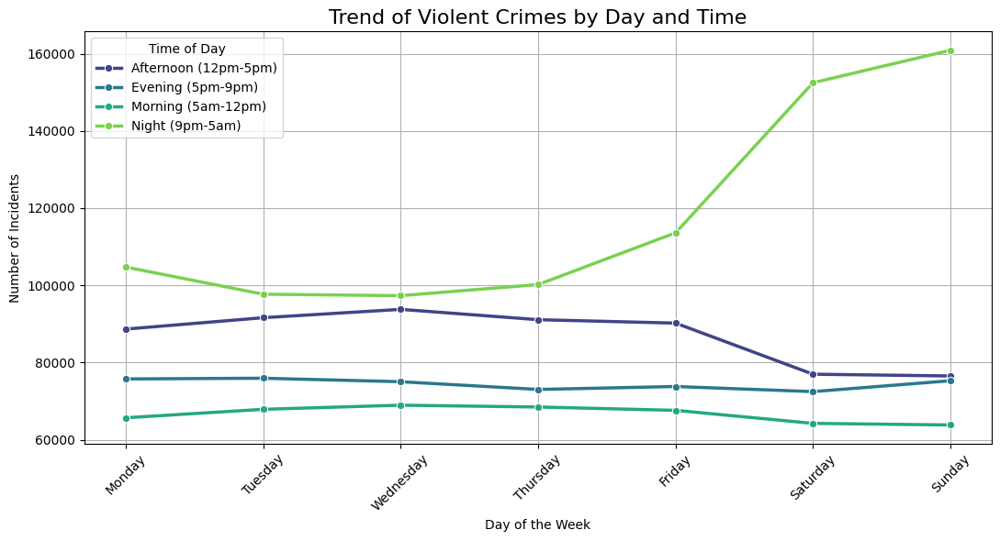

In [30]:
crime_categories = crime_counts['Crime Category'].unique()

for category in crime_categories:
    plt.figure(figsize=(11, 6))
    
    category_data = crime_counts[crime_counts['Crime Category'] == category]
    
    line_plot = sns.lineplot(
        data=category_data,
        x='Day of Week',
        y='Count',
        hue='Time of Day',
        palette='viridis',
        marker='o',
        linewidth=2.5
    )
    
    plt.title(f'Trend of {category} Crimes by Day and Time', fontsize=16)
    plt.xlabel('Day of the Week')
    plt.ylabel('Number of Incidents')
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend(title='Time of Day')
    plt.tight_layout()
    plt.show()

## INSIGHT 29:
The chart for **Violent Crimes** shows a big and special pattern. While daytime crime stays mostly the same all week, the **"Night (9pm-5am)"** line shoots up from Friday into the weekend, hitting its high on Sunday. This clearly shows that violent crime is mostly packed into weekend nights, a time linked with more people going out and having fun.

## INSIGHT 30:
In a totally different way, **Property Crime** is highest on weekday afternoons and evenings. The **"Afternoon (12pm-5pm)"** and **"Night (9pm-5am)"** lines are highest from Monday to Friday, falling by a large amount on Saturday and Sunday. This pattern shows that property crimes like theft are linked to the flow of a normal work week, happening when people are traveling, buying things, and not at their houses.

## INSIGHT 31:
**Statutory/Other Crimes** show a different rhythm. Instead of a big jump, there's a slow rise from Monday to Friday at almost all times of the day. The **"Night"** and **"Afternoon"** times have the biggest numbers, hitting a high on Friday and Saturday before going down. This shows that these crimes, often found by police, grow steadily as more people are out and about toward the end of the week.

# CORRELATION ANALYSIS

# 19. How do the long-term (yearly), seasonal (monthly), and weekly crime trends in Chicago reveal the city's public safety evolution and provide a strategic blueprint for allocating police resources?

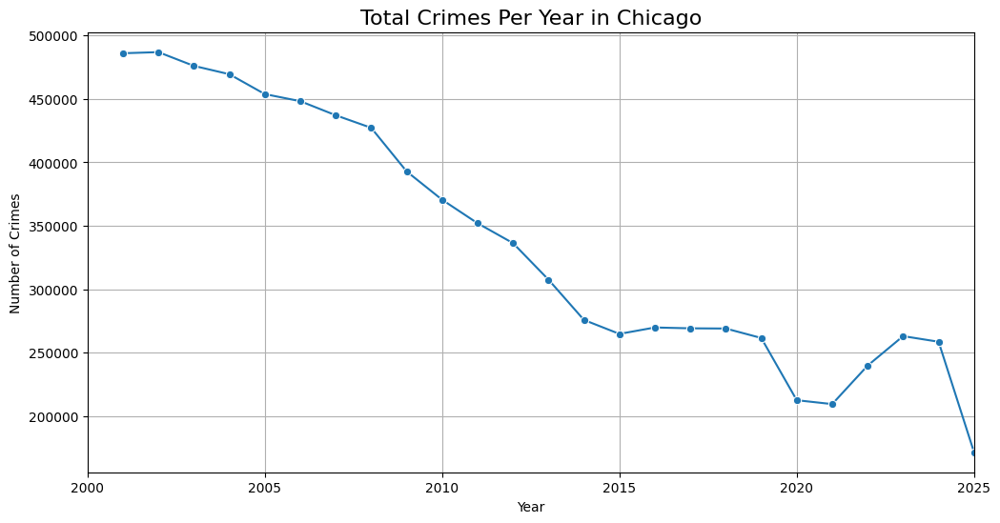

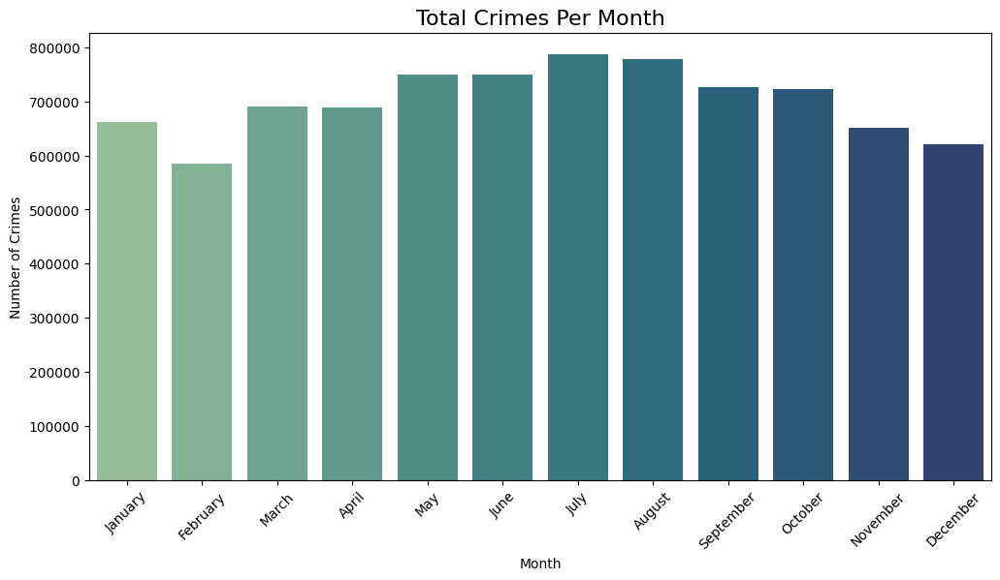

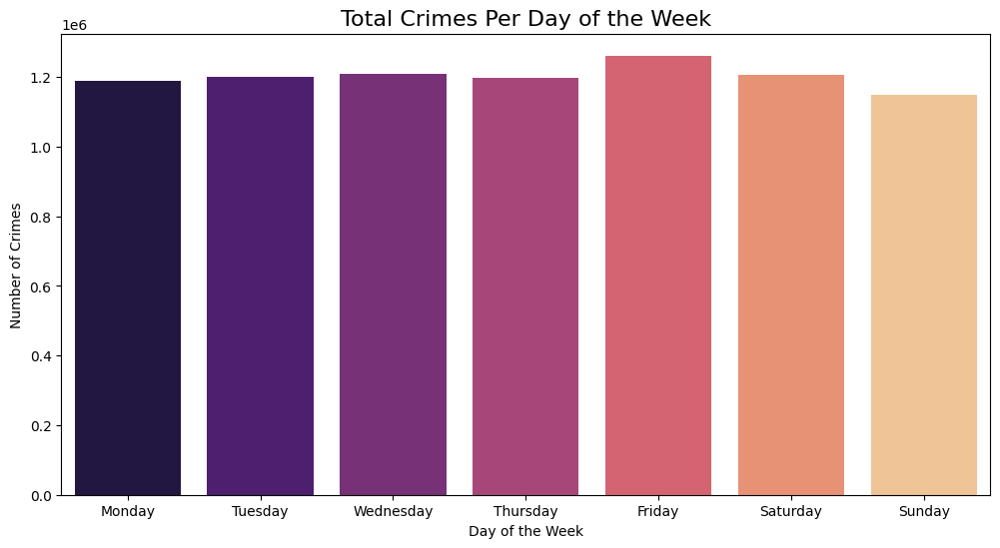

In [31]:
chicago_df['Year'] = chicago_df['Date'].dt.year

plt.figure(figsize=(12, 6))
yearly_crimes = chicago_df.groupby('Year').size()
sns.lineplot(
    x=yearly_crimes.index,
    y=yearly_crimes.values,
    marker='o'
)
plt.title('Total Crimes Per Year in Chicago', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.grid(True)
plt.xlim(2000, 2025)
plt.show()


plt.figure(figsize=(12, 6))
if 'Month' not in chicago_df.columns:
    chicago_df['Month'] = chicago_df['Date'].dt.month_name()

monthly_crimes = chicago_df.groupby('Month').size()
month_order = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]
monthly_crimes = monthly_crimes.reindex(month_order)

sns.barplot(
    x=monthly_crimes.index,
    y=monthly_crimes.values,
    palette='crest'
)
plt.title('Total Crimes Per Month', fontsize=16)
plt.xlabel('Month')
plt.ylabel('Number of Crimes')
plt.xticks(rotation=45)
plt.show()


plt.figure(figsize=(12, 6))
if 'Day of Week' not in chicago_df.columns:
    chicago_df['Day of Week'] = chicago_df['Date'].dt.day_name()

daily_crimes = chicago_df.groupby('Day of Week').size()
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
daily_crimes = daily_crimes.reindex(day_order)

sns.barplot(
    x=daily_crimes.index,
    y=daily_crimes.values,
    palette='magma'
)
plt.title('Total Crimes Per Day of the Week', fontsize=16)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Crimes')
plt.show()

### Crime Shows a Major Long-Term Decline
# Insight 32:
The yearly chart shows good news. Overall, crime in Chicago has gone down a lot since the early 2000s. There has been a big, steady drop over time. 📉

**Suggestion:** Analyze the policies or community factors that contributed to this long-term decline. Identifying what worked can help sustain this positive trend.

---

### Crime Follows Strong Seasonal and Weekly Cycles
# Insight 33:
Crime consistently peaks during the summer months and on the weekends. The numbers are highest in July and August and spike every week on Friday and Saturday. This shows clear, predictable cycles of when crime is most likely to occur.☀️🗓️

**Suggestion:** Align police resources with these cycles. This means increasing patrols during summer months and ensuring maximum officer strength on weekend nights to manage the predictable rise in incidents.

# 20. How do the weekly patterns of Homicides differ across three distinct environments: on the Street, in an Apartment, and in an Alley?

In [34]:
if 'Date' in chicago_df.columns:
    chicago_df['Date'] = pd.to_datetime(chicago_df['Date'], errors='coerce')
    if 'Day of Week' not in chicago_df.columns:
        chicago_df['Day of Week'] = chicago_df['Date'].dt.day_name()

df_homicide_street = chicago_df[(chicago_df['Primary Type'] == 'HOMICIDE') & (chicago_df['Location Description'] == 'STREET')]
df_homicide_apt = chicago_df[(chicago_df['Primary Type'] == 'HOMICIDE') & (chicago_df['Location Description'] == 'APARTMENT')]
df_homicide_vehicle = chicago_df[(chicago_df['Primary Type'] == 'HOMICIDE') & (chicago_df['Location Description'] == 'ALLEY')]

street_counts = df_homicide_street['Day of Week'].value_counts()
apt_counts = df_homicide_apt['Day of Week'].value_counts()
vehicle_counts = df_homicide_vehicle['Day of Week'].value_counts()

day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
street_counts = street_counts.reindex(day_order)
apt_counts = apt_counts.reindex(day_order)
vehicle_counts = vehicle_counts.reindex(day_order)

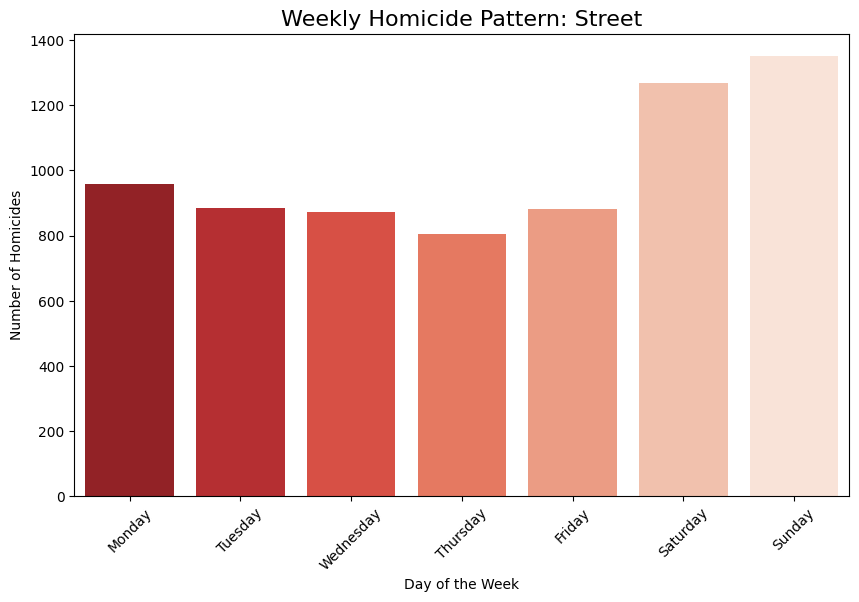

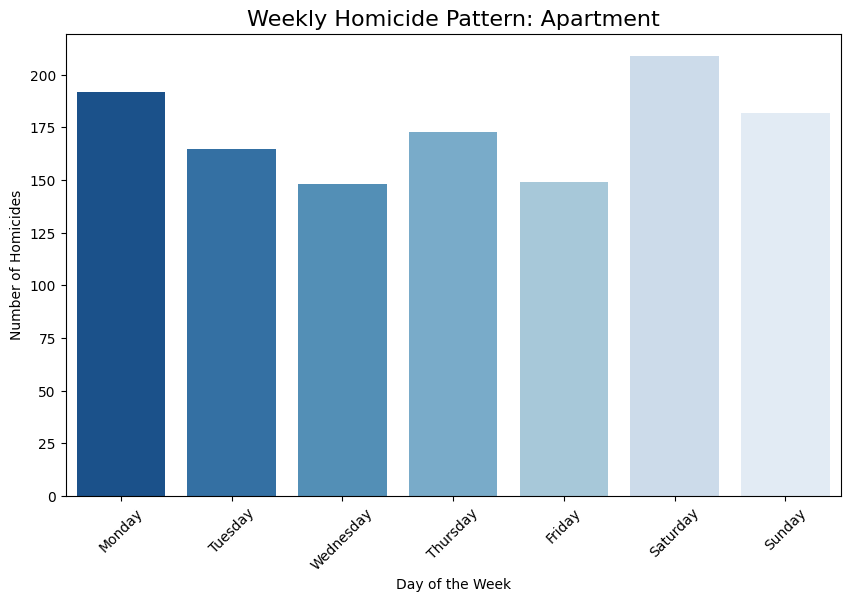

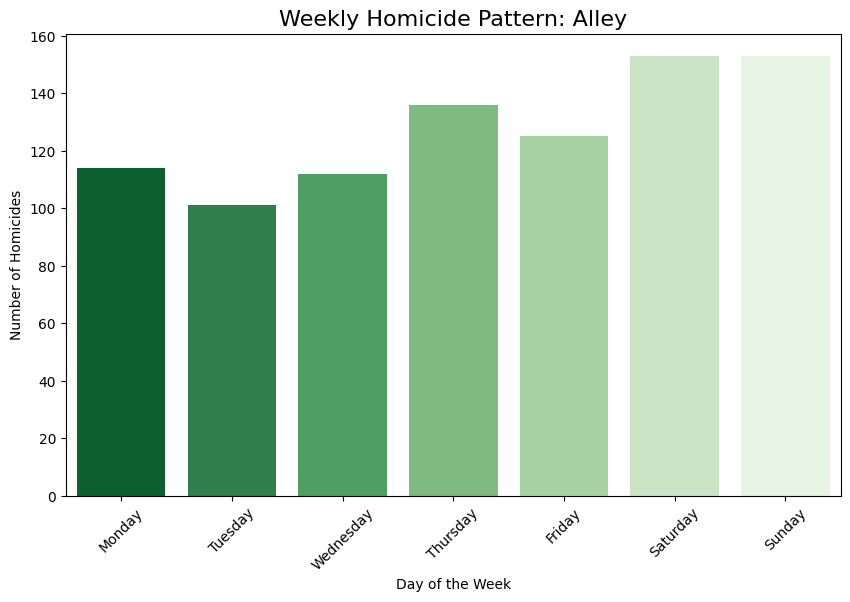

In [35]:
plt.figure(figsize=(10, 6))
sns.barplot(x=street_counts.index, y=street_counts.values, palette='Reds_r', order=day_order)
plt.title('Weekly Homicide Pattern: Street', fontsize=16)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Homicides')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x=apt_counts.index, y=apt_counts.values, palette='Blues_r', order=day_order)
plt.title('Weekly Homicide Pattern: Apartment', fontsize=16)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Homicides')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x=vehicle_counts.index, y=vehicle_counts.values, palette='Greens_r', order=day_order)
plt.title('Weekly Homicide Pattern: Alley', fontsize=16)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Homicides')
plt.xticks(rotation=45)
plt.show()

# INSIGHT 34:
The charts for **Street** and **Alley** murders show a very similar and clear pattern. While the numbers are lower during the work week, they shoot up starting on Friday, hitting their highest points on **Saturday and Sunday**. This clearly shows that murders in public spaces are packed into the weekend, a time linked with more people being out at night.

# INSIGHT 35:
In a totally different way, murders inside an **Apartment** do not follow the weekend spike. The number of crimes is spread more evenly across the entire week, with a strange peak on **Monday** that is not seen in public spaces. This pattern shows that murders in homes are not tied to weekend nightlife and are likely driven by other reasons, like private disputes.

# DATA VISUALIZATION USING FOLIUM HEATMAP

# Battery Hotspots in Wrigleyville

In [36]:
def create_map(data, title):
    map_object = folium.Map(location=[41.948, -87.655], zoom_start=16)
    heat_data = [[row['Latitude'], row['Longitude']] for index, row in data.iterrows()]
    HeatMap(heat_data, radius=15).add_to(map_object)
    map_object.get_root().html.add_child(folium.Element(f"<h2>{title}</h2>"))
    return map_object

if 'Date' in chicago_df.columns:
    chicago_df['Date'] = pd.to_datetime(chicago_df['Date'], errors='coerce')
    if 'Day of Week' not in chicago_df.columns:
        chicago_df['Day of Week'] = chicago_df['Date'].dt.day_name()

df_battery = chicago_df[chicago_df['Primary Type'] == 'BATTERY'].dropna(subset=['Latitude', 'Longitude'])

wrigleyville_bounds = {
    'min_lat': 41.945, 'max_lat': 41.951,
    'min_lon': -87.66, 'max_lon': -87.65
}

df_battery_wrigley = df_battery[
    (df_battery['Latitude'] >= wrigleyville_bounds['min_lat']) & (df_battery['Latitude'] <= wrigleyville_bounds['max_lat']) &
    (df_battery['Longitude'] >= wrigleyville_bounds['min_lon']) & (df_battery['Longitude'] <= wrigleyville_bounds['max_lon'])
]

weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
df_weekday = df_battery_wrigley[df_battery_wrigley['Day of Week'].isin(weekdays)]
df_weekend = df_battery_wrigley[~df_battery_wrigley['Day of Week'].isin(weekdays)]


map_weekday = create_map(df_weekday, "Battery Hotspots in Wrigleyville (Weekdays)")
map_weekday.save("weekday_battery_map.html")
print("Weekday map saved to weekday_battery_map.html")
display(map_weekday)


map_weekend = create_map(df_weekend, "Battery Hotspots in Wrigleyville (Weekends)")
map_weekend.save("weekend_battery_map.html")
print("Weekend map saved to weekend_battery_map.html")
display(map_weekend)

Weekday map saved to weekday_battery_map.html


Weekend map saved to weekend_battery_map.html


--- 

# Street Homicide Hotspots for 2023

In [37]:
if 'Date' in chicago_df.columns:
    chicago_df['Date'] = pd.to_datetime(chicago_df['Date'], errors='coerce')
    if 'Year' not in chicago_df.columns:
        chicago_df['Year'] = chicago_df['Date'].dt.year

year_to_map = 2023

df_filtered = chicago_df[
    (chicago_df['Primary Type'] == 'HOMICIDE') & 
    (chicago_df['Location Description'] == 'STREET') &
    (chicago_df['Year'] == year_to_map)
].dropna(subset=['Latitude', 'Longitude'])

homicide_map_single_year = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

heat_data = [[row['Latitude'], row['Longitude']] for index, row in df_filtered.iterrows()]

if heat_data:
    HeatMap(heat_data, radius=15).add_to(homicide_map_single_year)

homicide_map_single_year.get_root().html.add_child(folium.Element(f"<h2>Street Homicide Hotspots for {year_to_map}</h2>"))

output_filename = f"street_homicide_heatmap_{year_to_map}.html"
homicide_map_single_year.save(output_filename)
print(f"Static heatmap for {year_to_map} saved to {output_filename}")
display(homicide_map_single_year)

Static heatmap for 2023 saved to street_homicide_heatmap_2023.html


---

# Street Vehicle Theft Map

In [38]:
df_vehicle_theft_street = chicago_df[
    (chicago_df['Primary Type'] == 'MOTOR VEHICLE THEFT') &
    (chicago_df['Location Description'] == 'STREET')
].dropna(subset=['Latitude', 'Longitude'])

if len(df_vehicle_theft_street) > 1500:
    df_sample = df_vehicle_theft_street.sample(n=1500, random_state=1)
else:
    df_sample = df_vehicle_theft_street

chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=14)

for index, row in df_sample.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Stolen on: {row['Date']}",
        icon=folium.Icon(color='blue', icon='car', prefix='fa')
    ).add_to(chicago_map)

output_filename = "street_vehicle_theft_map.html"
chicago_map.save(output_filename)
print(f"Street vehicle theft map saved to {output_filename}")
display(chicago_map)

Street vehicle theft map saved to street_vehicle_theft_map.html


---

# Spatial Patterns of Armed and Unarmed Robberies in Chicago

In [39]:
df_robbery = chicago_df[chicago_df['Primary Type'] == 'ROBBERY'].dropna(subset=['Latitude', 'Longitude', 'Description'])

df_armed = df_robbery[df_robbery['Description'].str.contains("ARMED")]
df_unarmed = df_robbery[df_robbery['Description'] == 'STRONGARM - NO WEAPON']

if len(df_armed) > 750:
    df_armed_sample = df_armed.sample(n=750, random_state=1)
else:
    df_armed_sample = df_armed

if len(df_unarmed) > 750:
    df_unarmed_sample = df_unarmed.sample(n=750, random_state=1)
else:
    df_unarmed_sample = df_unarmed

chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=14)

for index, row in df_armed_sample.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"ARMED: {row['Date']}",
        icon=folium.Icon(color='red', icon='exclamation-triangle', prefix='fa')
    ).add_to(chicago_map)

for index, row in df_unarmed_sample.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"UNARMED: {row['Date']}",
        icon=folium.Icon(color='blue', icon='hand-rock-o', prefix='fa')
    ).add_to(chicago_map)

output_filename = "robbery_map.html"
chicago_map.save(output_filename)
print(f"Robbery map saved to {output_filename}")
display(chicago_map)

Robbery map saved to robbery_map.html


---

# Day vs. Night Prostitution Incidents in Chicago

In [40]:
if 'Date' in chicago_df.columns:
    chicago_df['Date'] = pd.to_datetime(chicago_df['Date'], errors='coerce')
    if 'Hour' not in chicago_df.columns:
        chicago_df['Hour'] = chicago_df['Date'].dt.hour

df_battery = chicago_df[chicago_df['Primary Type'] == 'PROSTITUTION'].dropna(subset=['Latitude', 'Longitude', 'Hour'])

df_day = df_battery[(df_battery['Hour'] >= 6) & (df_battery['Hour'] < 18)]
df_night = df_battery[(df_battery['Hour'] < 6) | (df_battery['Hour'] >= 18)]

if len(df_day) > 1000:
    df_day_sample = df_day.sample(n=1000, random_state=1)
else:
    df_day_sample = df_day

if len(df_night) > 1000:
    df_night_sample = df_night.sample(n=1000, random_state=1)
else:
    df_night_sample = df_night

chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=14)

for index, row in df_day_sample.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"DAY: {row['Date']}",
        icon=folium.Icon(color='orange', icon='sun-o', prefix='fa')
    ).add_to(chicago_map)

for index, row in df_night_sample.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"NIGHT: {row['Date']}",
        icon=folium.Icon(color='darkblue', icon='moon-o', prefix='fa')
    ).add_to(chicago_map)

output_filename = "day_night_battery_map.html"
chicago_map.save(output_filename)
print(f"Day vs. Night Battery map saved to {output_filename}")
display(chicago_map)

Day vs. Night Battery map saved to day_night_battery_map.html
